###Setup

In [1]:

import os, math, random, time, json, shutil
from pathlib import Path
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision
import torchvision.transforms as T
from torchvision.utils import make_grid, save_image


SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.benchmark = True

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

OUT = Path("/content/outputs")
(OUT / "vae").mkdir(parents=True, exist_ok=True)
(OUT / "gan").mkdir(parents=True, exist_ok=True)
(OUT / "metrics").mkdir(parents=True, exist_ok=True)
(OUT / "figs").mkdir(parents=True, exist_ok=True)

print("Device:", device)
print("Output dir:", OUT)


Device: cuda
Output dir: /content/outputs


###Utility functions for displaying results

In [2]:

import os, base64, mimetypes
from IPython.display import display, Image, HTML

def show_png(path, width=None):
    path = str(path)
    display(Image(filename=path, width=width))

def show_side_by_side(paths, width=320):
    tags = []
    for p in paths:
        p = str(p)
        if not os.path.exists(p):
            print(f"[show_side_by_side] Missing file: {p}")
            continue
        mime = mimetypes.guess_type(p)[0] or "image/png"
        with open(p, "rb") as f:
            b64 = base64.b64encode(f.read()).decode("ascii")
        tags.append(
            f'<img src="data:{mime};base64,{b64}" '
            f'width="{width}" style="margin-right:8px; border:1px solid #ddd; border-radius:4px;" />'
        )
    html = f'<div style="display:flex; align-items:flex-start; gap:8px;">{"".join(tags)}</div>'
    display(HTML(html))


###Data: CIFAR-10 loaders (train/test) + preview

100%|██████████| 170M/170M [00:13<00:00, 12.7MB/s]


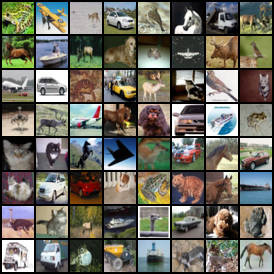

In [3]:
BATCH = 128
NUM_WORKERS=2

transform_train = T.Compose([
    T.RandomHorizontalFlip(),
    T.ToTensor(),
])

transform_eval = T.Compose([
    T.ToTensor(),
])

train_set = torchvision.datasets.CIFAR10(root="/content/data", train=True, download=True, transform=transform_train)
test_set = torchvision.datasets.CIFAR10(root="/content/data", train=False, download=True, transform=transform_eval)

train_loader = DataLoader(train_set, batch_size=BATCH, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=True)
test_loader = DataLoader(test_set,  batch_size=BATCH, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)


imgs, _ = next(iter(train_loader))
grid = make_grid(imgs[:64], nrow=8, normalize=True, value_range=(0,1))
save_image(grid, OUT / "figs" / "cifar10_preview.png")
grid.shape, grid.min().item(), grid.max().item()

show_png(OUT/"figs"/"cifar10_preview.png", width=512)

###VAE: Conv Encoder/Decoder (latent dim = 128)

In [4]:
class Encoder(nn.Module):
    def __init__(self, z_dim=128):
        super().__init__()
        # Input: (B,3,32,32)
        self.conv = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1), nn.ReLU(True), # 16x16
            nn.Conv2d(64, 128, 4, 2, 1), nn.BatchNorm2d(128), nn.ReLU(True), # 8x8
            nn.Conv2d(128, 256, 4, 2, 1), nn.BatchNorm2d(256), nn.ReLU(True), # 4x4
        )
        self.flatten = nn.Flatten()
        self.fc_mu  = nn.Linear(256*4*4, z_dim)
        self.fc_log = nn.Linear(256*4*4, z_dim)

    def forward(self, x):
        h = self.conv(x)
        h = self.flatten(h)
        mu  = self.fc_mu(h)
        logv = self.fc_log(h)
        return mu, logv

class Decoder(nn.Module):
    def __init__(self, z_dim=128):
        super().__init__()
        self.fc = nn.Linear(z_dim, 256*4*4)
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, 2, 1), nn.BatchNorm2d(128), nn.ReLU(True), # 8x8
            nn.ConvTranspose2d(128, 64, 4, 2, 1), nn.BatchNorm2d(64),  nn.ReLU(True), # 16x16
            nn.ConvTranspose2d(64, 3, 4, 2, 1), nn.Sigmoid() # 32x32, range [0,1]
        )

    def forward(self, z):
        h = self.fc(z).view(-1, 256, 4, 4)
        xrecon = self.deconv(h)
        return xrecon

class VAE(nn.Module):
    def __init__(self, z_dim=128):
        super().__init__()
        self.enc = Encoder(z_dim)
        self.dec = Decoder(z_dim)

    @staticmethod
    def reparameterize(mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.enc(x)
        z = self.reparameterize(mu, logvar)
        xrecon = self.dec(z)
        return xrecon, mu, logvar

def kl_divergence(mu, logvar):
    return 0.5 * torch.sum(torch.exp(logvar) + mu**2 - 1. - logvar, dim=1)

vae = VAE(z_dim=128).to(device)
sum(p.numel() for p in vae.parameters())/1e6

2.895875

###Training VAE (recon + β-KL)

/tmp/ipython-input-3079336907.py:8: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-3079336907.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device.type=='cuda')):


[VAE][Epoch 1] loss=0.0368 recon=0.0306 KL=18.99
[VAE][Epoch 2] loss=0.0278 recon=0.0212 KL=20.45



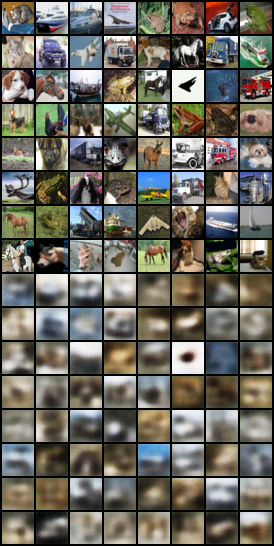
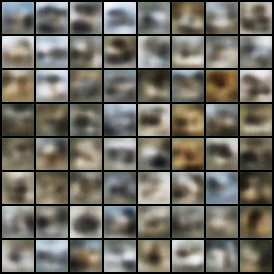

[VAE][Epoch 3] loss=0.0266 recon=0.0198 KL=20.91
[VAE][Epoch 4] loss=0.0261 recon=0.0192 KL=21.25



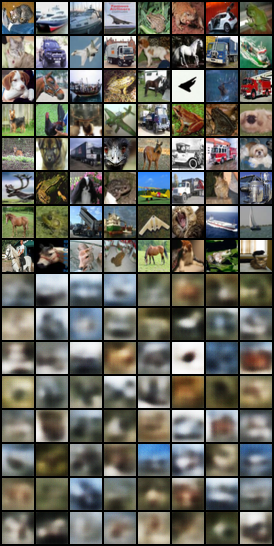
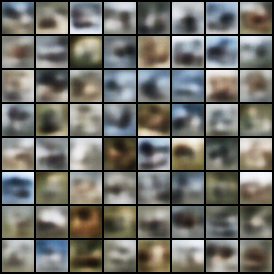

[VAE][Epoch 5] loss=0.0258 recon=0.0188 KL=21.61
[VAE][Epoch 6] loss=0.0256 recon=0.0185 KL=21.83



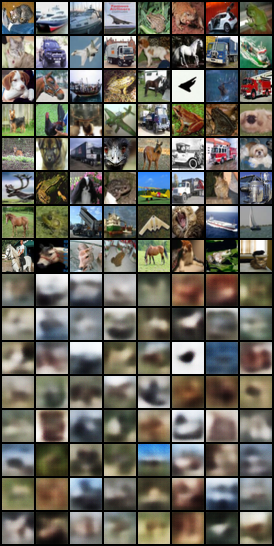
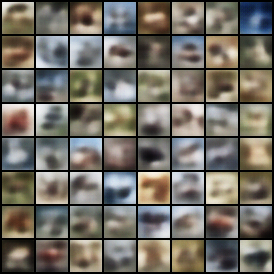

[VAE][Epoch 7] loss=0.0254 recon=0.0182 KL=22.15
[VAE][Epoch 8] loss=0.0253 recon=0.0180 KL=22.22



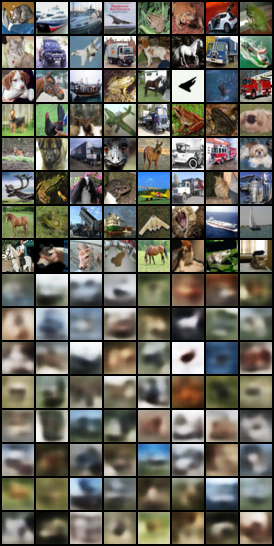
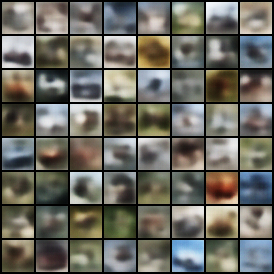

[VAE][Epoch 9] loss=0.0252 recon=0.0179 KL=22.39
[VAE][Epoch 10] loss=0.0251 recon=0.0178 KL=22.50



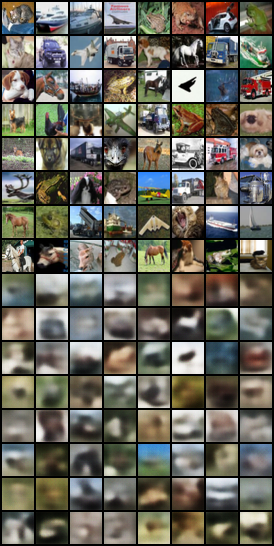
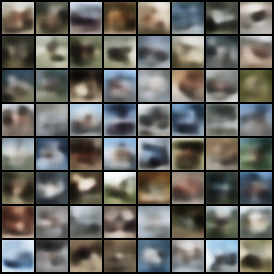

[VAE][Epoch 11] loss=0.0250 recon=0.0176 KL=22.59
[VAE][Epoch 12] loss=0.0249 recon=0.0175 KL=22.68



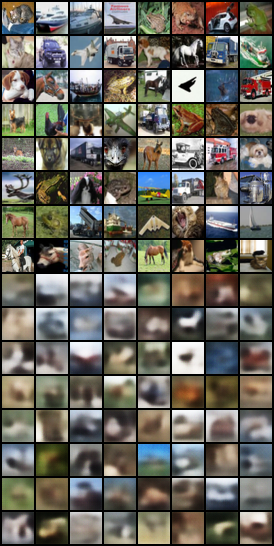
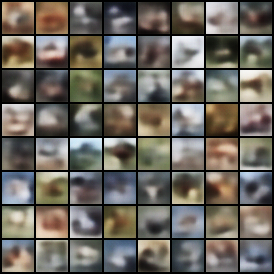

[VAE][Epoch 13] loss=0.0248 recon=0.0174 KL=22.73
[VAE][Epoch 14] loss=0.0248 recon=0.0174 KL=22.80



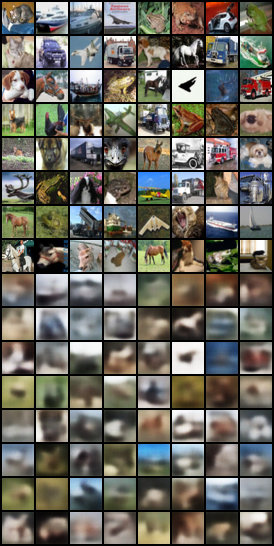
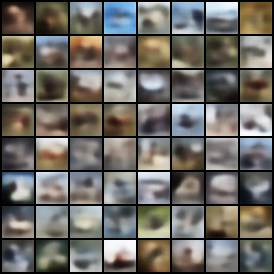

[VAE][Epoch 15] loss=0.0247 recon=0.0173 KL=22.84
[VAE][Epoch 16] loss=0.0247 recon=0.0172 KL=22.89



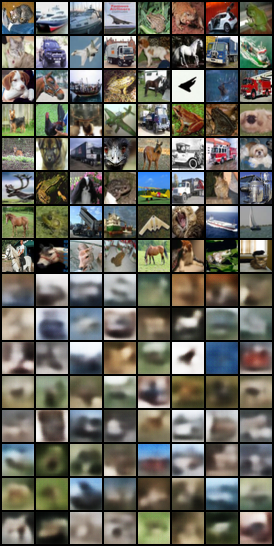
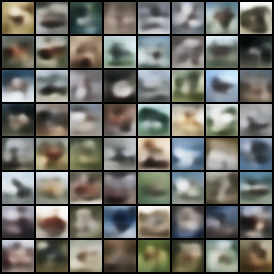

[VAE][Epoch 17] loss=0.0247 recon=0.0172 KL=22.90
[VAE][Epoch 18] loss=0.0246 recon=0.0172 KL=22.89



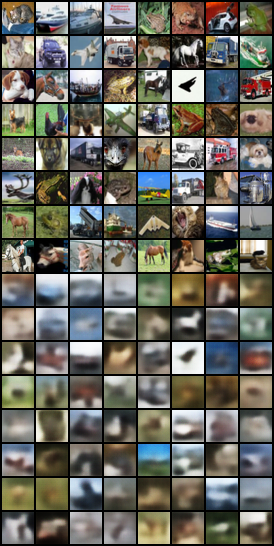
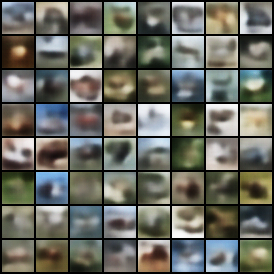

[VAE][Epoch 19] loss=0.0246 recon=0.0171 KL=22.94
[VAE][Epoch 20] loss=0.0246 recon=0.0171 KL=22.92



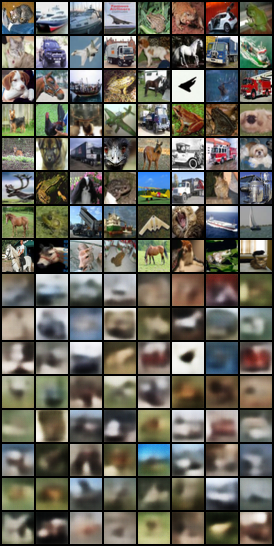
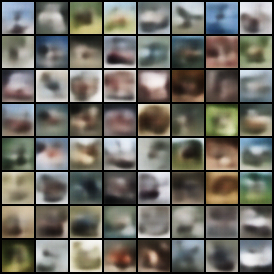

Saved: /content/outputs/vae


In [5]:
from torch.cuda.amp import autocast, GradScaler

VAE_EPOCHS = 20
LR_VAE = 2e-4
BETA = 1.0

opt_vae = torch.optim.Adam(vae.parameters(), lr=LR_VAE)
scaler = GradScaler(enabled=(device.type=='cuda'))

def vae_train_one_epoch(epoch):
    vae.train()
    losses, rec_losses, kl_losses = [], [], []
    for x, _ in train_loader:
        x = x.to(device, non_blocking=True)
        with autocast(enabled=(device.type=='cuda')):
            xhat, mu, logvar = vae(x)
            recon = F.mse_loss(xhat, x, reduction='none').mean(dim=(1,2,3))  #per-sample MSE
            kl = kl_divergence(mu, logvar)
            loss = (recon + BETA * kl / (32*32*3)).mean()  #normalize KL to image dims for scale balance

        opt_vae.zero_grad(set_to_none=True)
        scaler.scale(loss).backward()
        scaler.step(opt_vae)
        scaler.update()

        losses.append(loss.item())
        rec_losses.append(recon.mean().item())
        kl_losses.append(kl.mean().item())

    m_loss, m_rec, m_kl = np.mean(losses), np.mean(rec_losses), np.mean(kl_losses)
    print(f"[VAE][Epoch {epoch}] loss={m_loss:.4f} recon={m_rec:.4f} KL={m_kl:.2f}")
    return m_loss, m_rec, m_kl

def vae_eval_and_save(epoch, n=64):
    vae.eval()
    with torch.no_grad():
        x, _ = next(iter(test_loader))
        x = x.to(device)
        xhat, _, _ = vae(x)
        grid = make_grid(torch.cat([x[:n], xhat[:n]], dim=0), nrow=n//8, normalize=True, value_range=(0,1))
        save_image(grid, OUT / "vae" / f"recon_epoch{epoch}.png")

        z = torch.randn(n, 128, device=device)
        xgen = vae.dec(z)
        grid2 = make_grid(xgen, nrow=n//8, normalize=True, value_range=(0,1))
        save_image(grid2, OUT / "vae" / f"samples_epoch{epoch}.png")

VAE_LOG = []
for ep in range(1, VAE_EPOCHS+1):
    log = vae_train_one_epoch(ep)
    VAE_LOG.append({"epoch": ep, "loss": log[0], "recon": log[1], "kl": log[2]})
    if ep % 2 == 0 or ep == VAE_EPOCHS:
        vae_eval_and_save(ep)
        show_side_by_side([
            OUT/"vae"/f"recon_epoch{ep}.png",
            OUT/"vae"/f"samples_epoch{ep}.png",
        ], width=384)
        torch.save(vae.state_dict(), OUT / "vae" / f"vae_epoch{ep}.pt")

json.dump(VAE_LOG, open(OUT / "vae" / "train_log.json", "w"))
print("Saved:", OUT / "vae")

###VAE Reconstruction MSE on test set

[VAE] Test Reconstruction MSE: mean=0.01741 ± 0.00687


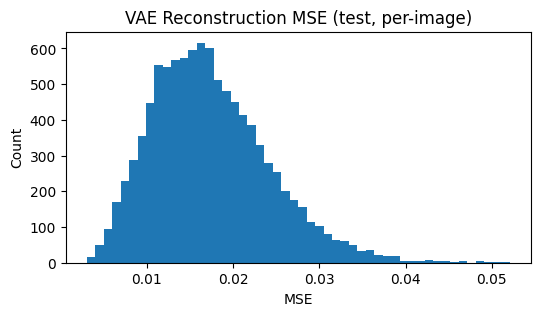

In [6]:
import matplotlib.pyplot as plt

vae.eval()
recon_errors = []
with torch.no_grad():
    for x, _ in test_loader:
        x = x.to(device)
        xhat, _, _ = vae(x)
        err = F.mse_loss(xhat, x, reduction='none').mean(dim=(1,2,3))
        recon_errors.extend(err.detach().cpu().tolist())

recon_mse_mean = float(np.mean(recon_errors))
recon_mse_std  = float(np.std(recon_errors))
print(f"[VAE] Test Reconstruction MSE: mean={recon_mse_mean:.5f} ± {recon_mse_std:.5f}")
json.dump({"recon_mse_mean":recon_mse_mean, "recon_mse_std":recon_mse_std}, open(OUT/"metrics"/"vae_recon_mse.json","w"))

plt.figure(figsize=(6,3))
plt.hist(recon_errors, bins=50)
plt.title("VAE Reconstruction MSE (test, per-image)")
plt.xlabel("MSE"); plt.ylabel("Count"); plt.show()


###DCGAN: Generator & Discriminator (32x32 CIFAR)

In [7]:
nz = 128
ngf = 64
ndf = 64

class G(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf*4, 4, 1, 0, bias=False), nn.BatchNorm2d(ngf*4), nn.ReLU(True),   # 4x4
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False), nn.BatchNorm2d(ngf*2), nn.ReLU(True),# 8x8
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False), nn.BatchNorm2d(ngf),   nn.ReLU(True),# 16x16
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False), nn.Tanh()  # 32x32 in [-1,1]
        )
    def forward(self, z):
        return self.net(z.view(z.size(0), nz, 1, 1))

class D(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, ndf, 4, 2, 1, bias=False), nn.LeakyReLU(0.2, inplace=True), # 16x16
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False), nn.BatchNorm2d(ndf*2), nn.LeakyReLU(0.2, True), # 8x8
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False), nn.BatchNorm2d(ndf*4), nn.LeakyReLU(0.2, True), # 4x4
            nn.Conv2d(ndf*4, 1, 4, 1, 0, bias=False)
        )
    def forward(self, x):
        return self.net(x).view(-1)

Gnet = G().to(device)
Dnet = D().to(device)

def weights_init(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)
weights_init(Gnet); weights_init(Dnet)

sum(p.numel() for p in Gnet.parameters())/1e6, sum(p.numel() for p in Dnet.parameters())/1e6

(1.183616, 0.663296)

###Training DCGAN (non-saturating BCE)

/tmp/ipython-input-1283402300.py:10: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerG = GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-1283402300.py:11: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerD = GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-1283402300.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device.type=='cuda')):
/tmp/ipython-input-1283402300.py:30: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device.type=='cuda')):
/tmp/ipython-input-1283402300.py:44: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...

[GAN][Epoch 1] D=0.4408 G=4.1445
[GAN][Epoch 2] D=0.4908 G=3.4862
[GAN][Epoch 3] D=0.5945 G=2.8594
[GAN][Epoch 4] D=0.5439 G=2.9219


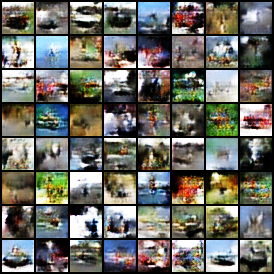

[GAN][Epoch 5] D=0.6186 G=2.6485
[GAN][Epoch 6] D=0.6564 G=2.5330
[GAN][Epoch 7] D=0.6879 G=2.4181
[GAN][Epoch 8] D=0.6081 G=2.4856
[GAN][Epoch 9] D=0.5569 G=2.5333


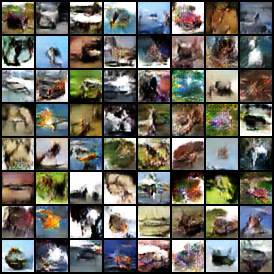

[GAN][Epoch 10] D=0.5675 G=2.5309
[GAN][Epoch 11] D=0.5462 G=2.5886
[GAN][Epoch 12] D=0.5084 G=2.5428
[GAN][Epoch 13] D=0.5703 G=2.5774
[GAN][Epoch 14] D=0.5354 G=2.5853


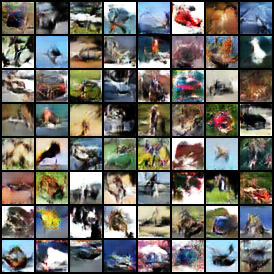

[GAN][Epoch 15] D=0.5262 G=2.5406
[GAN][Epoch 16] D=0.5053 G=2.5714
[GAN][Epoch 17] D=0.5826 G=2.6419
[GAN][Epoch 18] D=0.5094 G=2.5000
[GAN][Epoch 19] D=0.5079 G=2.5994


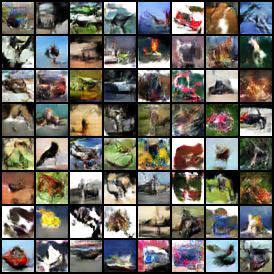

[GAN][Epoch 20] D=0.5117 G=2.6341
[GAN][Epoch 21] D=0.4296 G=2.6360
[GAN][Epoch 22] D=0.5108 G=2.6785
[GAN][Epoch 23] D=0.5347 G=2.6965
[GAN][Epoch 24] D=0.5010 G=2.6886


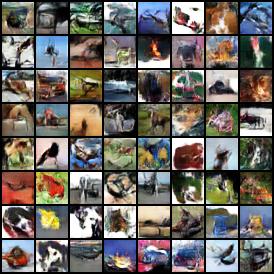

[GAN][Epoch 25] D=0.4401 G=2.7690
[GAN][Epoch 26] D=0.4294 G=2.8171
[GAN][Epoch 27] D=0.5566 G=2.7777
[GAN][Epoch 28] D=0.3838 G=2.8234
[GAN][Epoch 29] D=0.4356 G=2.9067


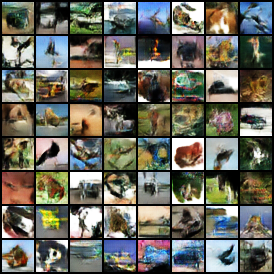

[GAN][Epoch 30] D=0.4781 G=2.8762
[GAN][Epoch 31] D=0.3941 G=2.9345
[GAN][Epoch 32] D=0.3636 G=2.9368
[GAN][Epoch 33] D=0.4755 G=2.9732
[GAN][Epoch 34] D=0.3584 G=3.0136


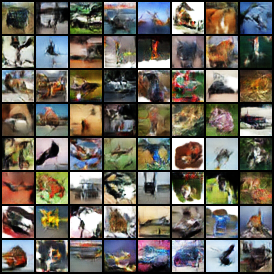

[GAN][Epoch 35] D=0.4139 G=2.9952
[GAN][Epoch 36] D=0.3717 G=3.0282
[GAN][Epoch 37] D=0.3703 G=3.0653
[GAN][Epoch 38] D=0.4045 G=3.0349
[GAN][Epoch 39] D=0.4653 G=2.9714


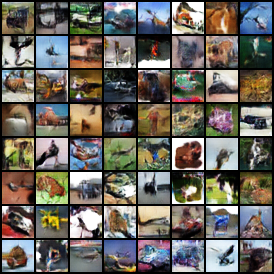

[GAN][Epoch 40] D=0.3517 G=3.0414
Saved: /content/outputs/gan


In [8]:
from torch.cuda.amp import autocast, GradScaler

GAN_EPOCHS = 40
LR_G = 2e-4
LR_D = 2e-4
BETA1 = 0.5; BETA2 = 0.999

optG = torch.optim.Adam(Gnet.parameters(), lr=LR_G, betas=(BETA1, BETA2))
optD = torch.optim.Adam(Dnet.parameters(), lr=LR_D, betas=(BETA1, BETA2))
scalerG = GradScaler(enabled=(device.type=='cuda'))
scalerD = GradScaler(enabled=(device.type=='cuda'))

fixed_z = torch.randn(64, nz, device=device)

def d_step(real):
    Dnet.train(); Gnet.train()
    bsz = real.size(0)
    #scale real images to [-1,1] for DCGAN
    real = real*2 - 1

    # real loss
    with autocast(enabled=(device.type=='cuda')):
        pred_real = Dnet(real)
        loss_real = F.binary_cross_entropy_with_logits(pred_real, torch.ones_like(pred_real))

    # fake loss
    z = torch.randn(bsz, nz, device=device)
    with torch.no_grad():
        fake = Gnet(z)
    with autocast(enabled=(device.type=='cuda')):
        pred_fake = Dnet(fake)
        loss_fake = F.binary_cross_entropy_with_logits(pred_fake, torch.zeros_like(pred_fake))

    lossD = loss_real + loss_fake
    optD.zero_grad(set_to_none=True)
    scalerD.scale(lossD).backward()
    scalerD.step(optD)
    scalerD.update()
    return lossD.item(), loss_real.item(), loss_fake.item()

def g_step(bsz):
    Gnet.train(); Dnet.train()
    z = torch.randn(bsz, nz, device=device)
    with autocast(enabled=(device.type=='cuda')):
        fake = Gnet(z)
        pred = Dnet(fake)
        lossG = F.binary_cross_entropy_with_logits(pred, torch.ones_like(pred))  # non-saturating

    optG.zero_grad(set_to_none=True)
    scalerG.scale(lossG).backward()
    scalerG.step(optG)
    scalerG.update()
    return lossG.item()

GAN_LOG = []
for ep in range(1, GAN_EPOCHS+1):
    d_losses, g_losses = [], []
    for x, _ in train_loader:
        x = x.to(device, non_blocking=True)
        dloss, dreal, dfake = d_step(x)
        gloss = g_step(x.size(0))
        d_losses.append(dloss); g_losses.append(gloss)


    with torch.no_grad():
        samples = Gnet(fixed_z).add(1).div(2).clamp(0,1)
    grid = make_grid(samples, nrow=8, normalize=True, value_range=(0,1))
    save_image(grid, OUT / "gan" / f"samples_epoch{ep}.png")
    if ep%5==0 or ep == GAN_EPOCHS:
        show_png(OUT/"gan"/f"samples_epoch{ep}.png", width=384)
    log = {"epoch": ep, "D": float(np.mean(d_losses)), "G": float(np.mean(g_losses))}
    GAN_LOG.append(log)
    print(f"[GAN][Epoch {ep}] D={log['D']:.4f} G={log['G']:.4f}")

    if ep % 5 == 0 or ep == GAN_EPOCHS:
        torch.save(Gnet.state_dict(), OUT / "gan" / f"G_epoch{ep}.pt")
        torch.save(Dnet.state_dict(), OUT / "gan" / f"D_epoch{ep}.pt")

json.dump(GAN_LOG, open(OUT / "gan" / "train_log.json", "w"))
print("Saved:", OUT / "gan")


###VAE Reconstructions vs DCGAN Samples

Saved comparison grids in: /content/outputs/figs



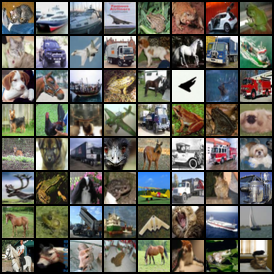
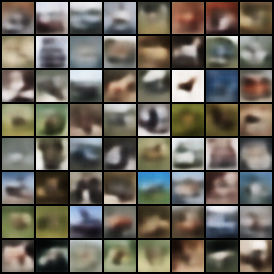
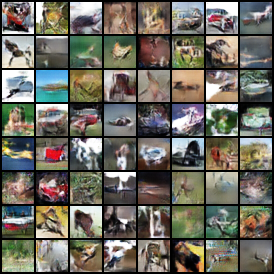

In [9]:
#side-by-side: original vs VAE recon vs GAN random samples
vae.eval(); Gnet.eval()
with torch.no_grad():
    # VAE recon on test set
    x, _ = next(iter(test_loader))
    x = x.to(device)
    xhat, _, _ = vae(x)
    # GAN samples
    z = torch.randn(x.size(0), nz, device=device)
    xsamp = Gnet(z).add(1).div(2).clamp(0,1)

save_image(make_grid(x[:64],     nrow=8, normalize=True, value_range=(0,1)), OUT/"figs"/"orig_grid.png")
save_image(make_grid(xhat[:64],  nrow=8, normalize=True, value_range=(0,1)), OUT/"figs"/"vae_recon_grid.png")
save_image(make_grid(xsamp[:64], nrow=8, normalize=True, value_range=(0,1)), OUT/"figs"/"gan_sample_grid.png")

print("Saved comparison grids in:", OUT/"figs")

show_side_by_side([
    OUT/"figs"/"orig_grid.png",
    OUT/"figs"/"vae_recon_grid.png",
    OUT/"figs"/"gan_sample_grid.png",
], width=320)


### FID & Inception Score (torchmetrics)

In [10]:

!pip -q install "torchmetrics[image]>=1.4.0" "torch-fidelity>=0.3.0" --progress-bar off

import importlib, sys
print("Python:", sys.version)

mods = {}
for m in ["torchmetrics", "torch_fidelity"]:
    try:
        importlib.import_module(m)
        mods[m] = "OK"
    except Exception as e:
        mods[m] = f"ERR: {type(e).__name__}: {e}"

print("Module availability:", mods)


from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.inception import InceptionScore
print("Imports OK")


Python: 3.12.11 (main, Jun  4 2025, 08:56:18) [GCC 11.4.0]
Module availability: {'torchmetrics': 'OK', 'torch_fidelity': 'OK'}
Imports OK


This cell computes:
- FID(real vs VAE recon)
- FID(real vs GAN samples)
- Inception Score for GAN samples (quality + diversity proxy)

In [11]:
import os, json, tempfile, numpy as np, torch, pandas as pd
from torchvision.utils import save_image

@torch.no_grad()
def collect_real_images(n=2000):
    imgs, total = [], 0
    for x, _ in test_loader:
        imgs.append(x)
        total += x.size(0)
        if total >= n: break
    return torch.cat(imgs, dim=0)[:n]

@torch.no_grad()
def collect_vae_recon(n=2000):
    vae.eval()
    xs, xhats = [], []
    total = 0
    for x, _ in test_loader:
        x = x.to(device)
        xhat, _, _ = vae(x)
        xs.append(x.detach().cpu()); xhats.append(xhat.detach().cpu())
        total += x.size(0)
        if total >= n: break
    return torch.cat(xs,0)[:n], torch.cat(xhats,0)[:n]

@torch.no_grad()
def collect_gan_samples(n=2000, batch=256):
    Gnet.eval()
    out, done = [], 0
    while done < n:
        b = min(batch, n-done)
        z = torch.randn(b, nz, device=device)
        x = Gnet(z).add(1).div(2).clamp(0,1)
        out.append(x.detach().cpu()); done += b
    return torch.cat(out,0)

def to_uint8(x):
    return (x.clamp(0,1)*255).to(torch.uint8)

N_METRICS = 5000
real = collect_real_images(N_METRICS)
real_uint8 = to_uint8(real)

real_for_vae, vae_recon = collect_vae_recon(N_METRICS)
vae_recon_uint8 = to_uint8(vae_recon)

gan_samps = collect_gan_samples(N_METRICS)
gan_samps_uint8 = to_uint8(gan_samps)


save_image(real[:64],       OUT/"figs"/"metrics_real_preview.png", nrow=8)
save_image(vae_recon[:64],  OUT/"figs"/"metrics_vae_preview.png",  nrow=8)
save_image(gan_samps[:64],  OUT/"figs"/"metrics_gan_preview.png",  nrow=8)

fid_vae = fid_gan = None
is_mean = is_std = None
path = None


try:
    from torchmetrics.image.fid import FrechetInceptionDistance
    from torchmetrics.image.inception import InceptionScore

    fid = FrechetInceptionDistance(normalize=True).to(device)
    fid.update(real_uint8.to(device), real=True)
    fid.update(vae_recon_uint8.to(device), real=False)
    fid_vae = float(fid.compute().item())
    fid.reset()

    fid.update(real_uint8.to(device), real=True)
    fid.update(gan_samps_uint8.to(device), real=False)
    fid_gan = float(fid.compute().item())

    is_metric = InceptionScore(splits=10).to(device)
    is_metric.update(gan_samps_uint8.to(device))
    is_mean_, is_std_ = is_metric.compute()
    is_mean, is_std = float(is_mean_.item()), float(is_std_.item())

    path = "torchmetrics"
    print("[metrics] Computed with torchmetrics")

except Exception as e:
    print(f"[metrics] torchmetrics failed ({type(e).__name__}: {e}) — using torch_fidelity fallback…")
    from torch_fidelity import calculate_metrics

    def dump_pngs(tensor_nchw, root_dir):
        os.makedirs(root_dir, exist_ok=True)
        for i in range(tensor_nchw.size(0)):
            save_image(tensor_nchw[i], os.path.join(root_dir, f"{i:06d}.png"))

    with tempfile.TemporaryDirectory() as tmpdir:
        real_dir = os.path.join(tmpdir, "real")
        vae_dir  = os.path.join(tmpdir, "vae")
        gan_dir  = os.path.join(tmpdir, "gan")

        dump_pngs(real, real_dir)
        dump_pngs(vae_recon, vae_dir)
        dump_pngs(gan_samps, gan_dir)

        # FID
        m_vae = calculate_metrics(
            input1=real_dir, input2=vae_dir, cuda=(device.type=="cuda"),
            isc=False, fid=True, kid=False, verbose=False
        )
        m_gan = calculate_metrics(
            input1=real_dir, input2=gan_dir, cuda=(device.type=="cuda"),
            isc=True,  fid=True, kid=False, verbose=False
        )
        fid_vae = float(m_vae["frechet_inception_distance"])
        fid_gan = float(m_gan["frechet_inception_distance"])
        is_mean = float(m_gan.get("inception_score_mean", float("nan")))
        is_std  = float(m_gan.get("inception_score_std",  float("nan")))
        path = "torch_fidelity"
        print("[metrics] Computed with torch_fidelity fallback")

print(f"FID (real vs VAE recon): {fid_vae:.2f}")
print(f"FID (real vs GAN samp):  {fid_gan:.2f}")
print(f"Inception Score (GAN):  {is_mean:.2f} ± {is_std:.2f}")

json.dump({
    "path": path,
    "fid_vae": fid_vae,
    "fid_gan": fid_gan,
    "is_gan_mean": is_mean,
    "is_gan_std": is_std,
    "n_eval": N_METRICS
}, open(OUT/"metrics"/"fid_is.json","w"))
print("Saved metrics to", OUT/"metrics"/"fid_is.json")


import json, pandas as pd
m = json.load(open(OUT/"metrics"/"fid_is.json"))
df = pd.DataFrame([{
    "Path": m.get("path", "unknown"),
    "FID (real vs VAE)": m.get("fid_vae"),
    "FID (real vs GAN)": m.get("fid_gan"),
    "IS (mean)": m.get("is_gan_mean"),
    "IS (std)": m.get("is_gan_std"),
    "N": m.get("n_eval"),
}])
display(df)



Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 184MB/s]


[metrics] torchmetrics failed (OutOfMemoryError: CUDA out of memory. Tried to allocate 13.23 GiB. GPU 0 has a total capacity of 22.16 GiB of which 3.33 GiB is free. Process 19383 has 18.83 GiB memory in use. Of the allocated memory 18.57 GiB is allocated by PyTorch, and 19.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)) — using torch_fidelity fallback…


/usr/local/lib/python3.12/dist-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


[metrics] Computed with torch_fidelity fallback
FID (real vs VAE recon): 264.21
FID (real vs GAN samp):  56.46
Inception Score (GAN):  10.53 ± 0.18
Saved metrics to /content/outputs/metrics/fid_is.json


,Path,FID (real vs VAE),FID (real vs GAN),IS (mean),IS (std),N
0,torch_fidelity,264.210613,56.462499,10.532513,0.177057,5000


###Class Coverage via CIFAR-10 classifier

[CLF][1] loss=1.821 acc_train=0.399 acc_test=0.402
[CLF][2] loss=1.564 acc_train=0.436 acc_test=0.436
[CLF][3] loss=1.450 acc_train=0.496 acc_test=0.499
[CLF][4] loss=1.361 acc_train=0.540 acc_test=0.541
[CLF][5] loss=1.278 acc_train=0.543 acc_test=0.541
Approx class counts among GAN samples: {0: 531, 1: 338, 2: 355, 3: 439, 4: 668, 5: 605, 6: 761, 7: 348, 8: 239, 9: 716}


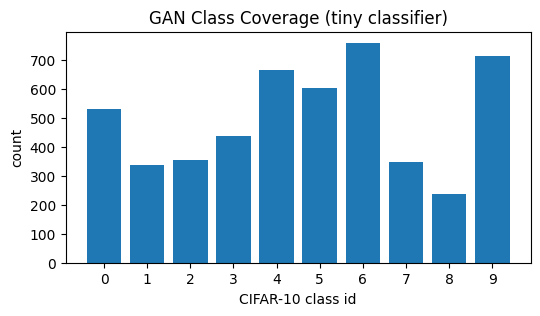

In [12]:


import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision.transforms as T

class TinyCIFAR(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 3, 1, 1), nn.ReLU(True),
            nn.MaxPool2d(2), # 16x16
            nn.Conv2d(64, 128, 3, 1, 1), nn.ReLU(True),
            nn.MaxPool2d(2), # 8x8
            nn.Conv2d(128, 256, 3, 1, 1), nn.ReLU(True),
            nn.AdaptiveAvgPool2d(1),
        )
        self.fc = nn.Linear(256, num_classes)
    def forward(self, x):
        h = self.net(x)
        h = h.view(h.size(0), -1)
        return self.fc(h)

clf = TinyCIFAR().to(device)
opt = torch.optim.Adam(clf.parameters(), lr=1e-3)
EPOCHS_CLF = 5

def acc(loader):
    clf.eval(); correct=total=0
    with torch.no_grad():
        for x,y in loader:
            x,y = x.to(device), y.to(device)
            pred = clf(x).argmax(1)
            correct += (pred==y).sum().item()
            total += y.numel()
    return correct/total

for ep in range(1, EPOCHS_CLF+1):
    clf.train()
    losses=[]
    for x,y in train_loader:
        x,y = x.to(device), y.to(device)
        logits = clf(x)
        loss = F.cross_entropy(logits, y)
        opt.zero_grad(); loss.backward(); opt.step()
        losses.append(loss.item())
    a_train = acc(train_loader); a_test = acc(test_loader)
    print(f"[CLF][{ep}] loss={np.mean(losses):.3f} acc_train={a_train:.3f} acc_test={a_test:.3f}")

# Prediction on generated GAN samples
with torch.no_grad():
    preds = []
    for i in range(0, gan_samps.size(0), 256):
        x = gan_samps[i:i+256].to(device)
        pred = clf(x).argmax(1).detach().cpu().numpy()
        preds.append(pred)
    preds = np.concatenate(preds)

counts = {int(k): int(v) for k,v in zip(*np.unique(preds, return_counts=True))}
print("Approx class counts among GAN samples:", counts)
json.dump({"gan_class_counts": counts}, open(OUT/"metrics"/"gan_class_counts.json","w"))


labels = list(map(str, sorted(counts.keys())))
vals = [counts[int(k)] for k in labels]
plt.figure(figsize=(6,3))
plt.bar(labels, vals)
plt.title("GAN Class Coverage (tiny classifier)")
plt.xlabel("CIFAR-10 class id"); plt.ylabel("count")
plt.show()


##Training curves (VAE & GAN)

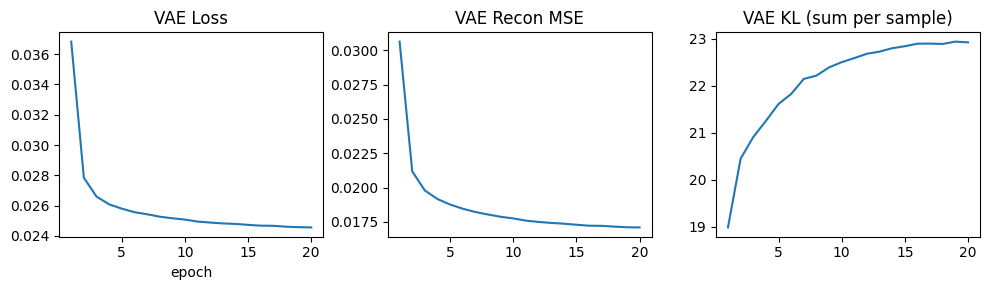

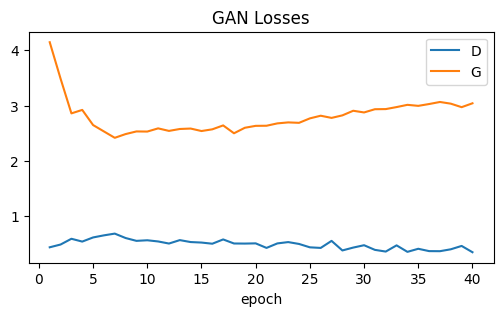

In [13]:
import json, matplotlib.pyplot as plt, numpy as np

vae_log = json.load(open(OUT/"vae"/"train_log.json"))
gan_log = json.load(open(OUT/"gan"/"train_log.json"))

# VAE
ep_v = [e["epoch"] for e in vae_log]
loss_v = [e["loss"] for e in vae_log]
reco_v = [e["recon"] for e in vae_log]
kl_v   = [e["kl"] for e in vae_log]
plt.figure(figsize=(10,3))
plt.subplot(1,3,1); plt.plot(ep_v, loss_v); plt.title("VAE Loss"); plt.xlabel("epoch")
plt.subplot(1,3,2); plt.plot(ep_v, reco_v); plt.title("VAE Recon MSE")
plt.subplot(1,3,3); plt.plot(ep_v, kl_v);   plt.title("VAE KL (sum per sample)")
plt.tight_layout(); plt.show()

# GAN
ep_g = [e["epoch"] for e in gan_log]
D_l = [e["D"] for e in gan_log]
G_l = [e["G"] for e in gan_log]
plt.figure(figsize=(6,3))
plt.plot(ep_g, D_l, label="D"); plt.plot(ep_g, G_l, label="G")
plt.title("GAN Losses"); plt.xlabel("epoch"); plt.legend(); plt.show()

###Latent Interpolation: VAE (x→z→x̂) and GAN (z→x̃)

VAE classes: 3 → 8 | Saved: /content/outputs/figs/interp_vae.png
Saved: /content/outputs/figs/interp_gan.png



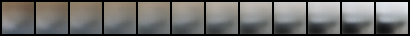
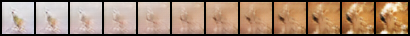

In [14]:

import torch
from torchvision.utils import make_grid, save_image
import numpy as np

vae.eval(); Gnet.eval()

# VAE: picking two test images from different classes, encoding to mu, interpolating in z
with torch.no_grad():
    xa, ya = None, None
    xb, yb = None, None
    for x, y in test_loader:
        for i in range(x.size(0)):
            if xa is None:
                xa, ya = x[i:i+1].to(device), int(y[i].item())
            else:
                if int(y[i].item()) != ya:
                    xb, yb = x[i:i+1].to(device), int(y[i].item())
                    break
        if xb is not None: break

    mu_a, logv_a = vae.enc(xa)
    mu_b, logv_b = vae.enc(xb)

    T_STEPS = 12
    alphas = torch.linspace(0, 1, T_STEPS, device=device).view(-1,1)
    z_interp = (1 - alphas) * mu_a + alphas * mu_b
    x_interp = vae.dec(z_interp).clamp(0,1)

# GAN: picking two random z that produce distinct outputs, then interpolating
with torch.no_grad():
    def gen(z):
        return Gnet(z).add(1).div(2).clamp(0,1)

    z1 = torch.randn(1, 128, device=device)
    z2 = torch.randn(1, 128, device=device)

    for _ in range(10):
        if torch.nn.functional.cosine_similarity(z1, z2) < 0.95:
            break
        z2 = torch.randn(1, 128, device=device)

    alphas_g = torch.linspace(0, 1, T_STEPS, device=device).view(-1,1)
    z_interp_g = (1 - alphas_g) * z1 + alphas_g * z2
    x_interp_g = gen(z_interp_g)

grid_vae = make_grid(x_interp, nrow=T_STEPS, normalize=True, value_range=(0,1))
grid_gan = make_grid(x_interp_g, nrow=T_STEPS, normalize=True, value_range=(0,1))
save_image(grid_vae, OUT/"figs"/"interp_vae.png")
save_image(grid_gan, OUT/"figs"/"interp_gan.png")

print(f"VAE classes: {ya} → {yb} | Saved:", OUT/"figs"/"interp_vae.png")
print("Saved:", OUT/"figs"/"interp_gan.png")


try:
    show_side_by_side([OUT/"figs"/"interp_vae.png", OUT/"figs"/"interp_gan.png"], width=420)
except:
    from IPython.display import Image, display
    display(Image(filename=str(OUT/"figs"/"interp_vae.png"), width=840))
    display(Image(filename=str(OUT/"figs"/"interp_gan.png"), width=840))


###VAE Latent Representation: PCA & t-SNE

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


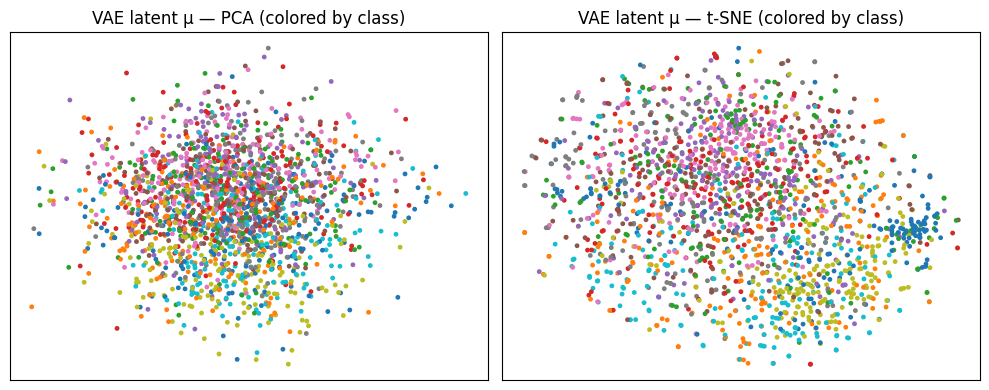

In [15]:
import torch, numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

vae.eval()
N_EMB = 2000  # adjust for speed/quality
Zs, Ys = [], []
with torch.no_grad():
    total = 0
    for x, y in test_loader:
        x = x.to(device)
        mu, _ = vae.enc(x)
        Zs.append(mu.detach().cpu().numpy())
        Ys.append(y.numpy())
        total += x.size(0)
        if total >= N_EMB: break
Z = np.concatenate(Zs, axis=0)[:N_EMB]
Y = np.concatenate(Ys, axis=0)[:N_EMB]

# PCA (2D)
pca = PCA(n_components=2, random_state=42)
Z_pca = pca.fit_transform(Z)

# t-SNE (2D)
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, learning_rate='auto', init='pca', random_state=42)
Z_tsne = tsne.fit_transform(Z)

# plots
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.scatter(Z_pca[:,0], Z_pca[:,1], c=Y, s=6, cmap='tab10')
plt.title("VAE latent μ — PCA (colored by class)"); plt.xticks([]); plt.yticks([])
plt.subplot(1,2,2)
plt.scatter(Z_tsne[:,0], Z_tsne[:,1], c=Y, s=6, cmap='tab10')
plt.title("VAE latent μ — t-SNE (colored by class)"); plt.xticks([]); plt.yticks([])
plt.tight_layout()
plt.show()


###VAE Semantic Factors: 1D Traversals

Traversed dims (by variance): [14, 123, 121, 110, 13, 93]
Saved: /content/outputs/figs/vae_semantic_traversals.png


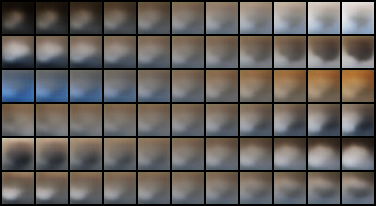

In [16]:
import torch
from torchvision.utils import make_grid, save_image
import numpy as np

vae.eval()
# pickig one anchor image
with torch.no_grad():
    x0, y0 = next(iter(test_loader))
    x0 = x0[:1].to(device)
    mu0, logv0 = vae.enc(x0)
    zdim = mu0.size(1)

# estimating per-dim variance across a subset to pick interesting dims
with torch.no_grad():
    Zs = []
    total = 0
    for x, _ in test_loader:
        x = x.to(device)
        mu, _ = vae.enc(x)
        Zs.append(mu.detach().cpu())
        total += x.size(0)
        if total >= 2000: break
    Zall = torch.cat(Zs, dim=0)
var_per_dim = torch.var(Zall, dim=0)
topk = torch.topk(var_per_dim, k=min(6, zdim)).indices.tolist()

STEPS = 11
SWEEP_STD = 2.5
z_std = torch.std(Zall, dim=0, unbiased=False).to(device) + 1e-6

rows = []
with torch.no_grad():
    for d in topk:
        z = mu0.repeat(STEPS, 1)
        sweep = torch.linspace(-SWEEP_STD, SWEEP_STD, STEPS, device=device) * z_std[d]
        z[:, d] = (mu0[:, d] + sweep)
        xr = vae.dec(z).clamp(0,1)
        rows.append(xr)
    grid = make_grid(torch.cat(rows, dim=0), nrow=STEPS, normalize=True, value_range=(0,1))
    save_image(grid, OUT/"figs"/"vae_semantic_traversals.png")

print("Traversed dims (by variance):", topk)
print("Saved:", OUT/"figs"/"vae_semantic_traversals.png")

try:
    show_png(OUT/"figs"/"vae_semantic_traversals.png", width=960)
except:
    from IPython.display import Image, display
    display(Image(filename=str(OUT/"figs"/"vae_semantic_traversals.png"), width=960))


###GAN Latent PCA: 2D scatter

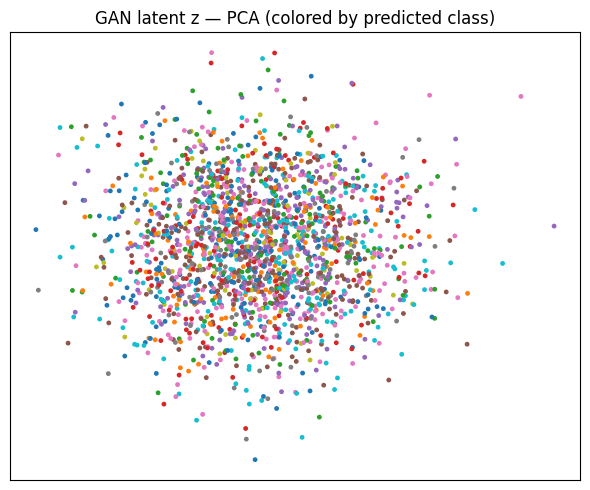

In [17]:
import torch, numpy as np, matplotlib.pyplot as plt
from sklearn.decomposition import PCA

Gnet.eval()

N_Z = 2000
with torch.no_grad():
    Z = torch.randn(N_Z, nz, device=device)
    X = Gnet(Z).add(1).div(2).clamp(0,1)

Y_pred = None
if 'clf' in globals():
    clf.eval()
    preds = []
    with torch.no_grad():
        for i in range(0, N_Z, 256):
            logits = clf(X[i:i+256].to(device))
            preds.append(torch.argmax(logits, dim=1).detach().cpu().numpy())
    Y_pred = np.concatenate(preds)

# PCA on latents Z (detach to CPU)
Z_cpu = Z.detach().cpu().numpy()
pca = PCA(n_components=2, random_state=42)
Z_pc = pca.fit_transform(Z_cpu)

plt.figure(figsize=(6,5))
if Y_pred is not None:
    plt.scatter(Z_pc[:,0], Z_pc[:,1], c=Y_pred, s=6, cmap='tab10')
    plt.title("GAN latent z — PCA (colored by predicted class)")
else:
    plt.scatter(Z_pc[:,0], Z_pc[:,1], s=6, c='gray')
    plt.title("GAN latent z — PCA")
plt.xticks([]); plt.yticks([]); plt.tight_layout(); plt.show()


###OOD Data: CIFAR-100 & SVHN loaders

100%|██████████| 169M/169M [00:12<00:00, 13.0MB/s]
100%|██████████| 64.3M/64.3M [00:11<00:00, 5.38MB/s]



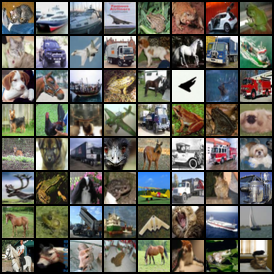
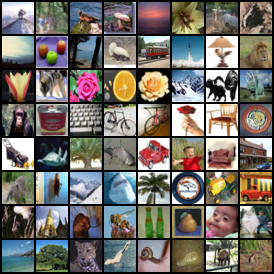
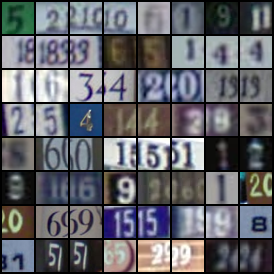

In [19]:
import torchvision, torchvision.transforms as T
from torch.utils.data import DataLoader
from torchvision.utils import make_grid, save_image

ood_transform = T.ToTensor()
c100_test = torchvision.datasets.CIFAR100(root="/content/data", train=False, download=True, transform=ood_transform)
svhn_test = torchvision.datasets.SVHN(root="/content/data", split="test", download=True, transform=ood_transform)

BATCH_OOD = 128
c100_loader = DataLoader(c100_test, batch_size=BATCH_OOD, shuffle=False, num_workers=2, pin_memory=True)
svhn_loader = DataLoader(svhn_test, batch_size=BATCH_OOD, shuffle=False, num_workers=2, pin_memory=True)

# previews
import itertools, torch
def preview(loader, name):
    x,_ = next(iter(loader))
    save_image(make_grid(x[:64], nrow=8, normalize=True, value_range=(0,1)), OUT/"figs"/f"{name}_preview.png")

preview(test_loader, "cifar10_test")
preview(c100_loader, "cifar100_test")
preview(svhn_loader, "svhn_test")

show_side_by_side([
    OUT/"figs"/"cifar10_test_preview.png",
    OUT/"figs"/"cifar100_test_preview.png",
    OUT/"figs"/"svhn_test_preview.png",
], width=320)

###VAE OOD Reconstructions + MSE (ID vs OOD)

ID mean±std: 0.01741 ± 0.00686
CIFAR-100 OOD mean±std: 0.01802 ± 0.00778
SVHN OOD mean±std: 0.00947 ± 0.00571



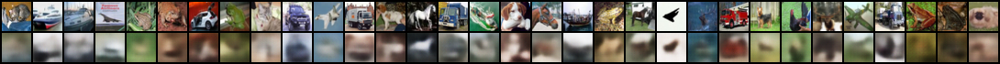
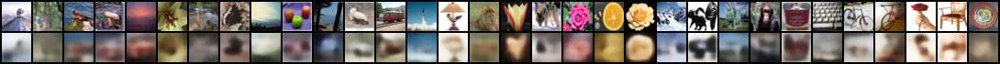
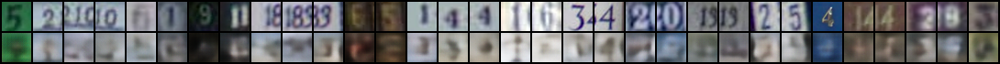

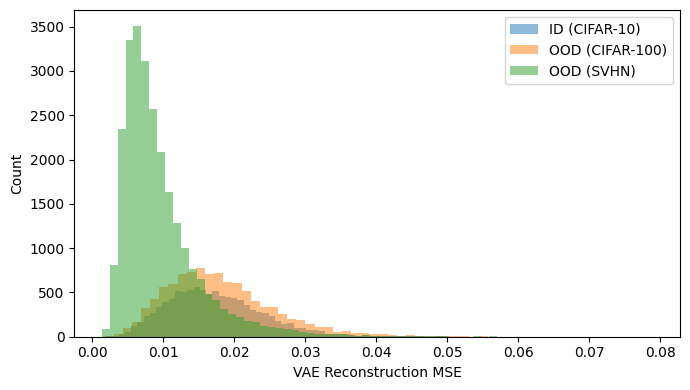


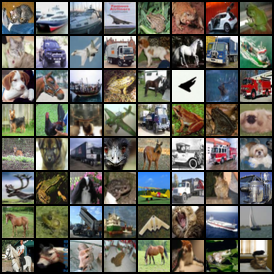
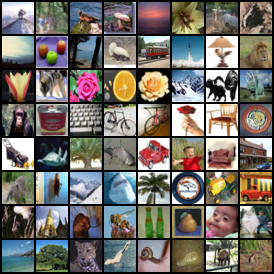
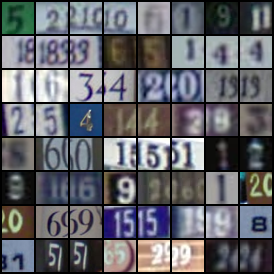

In [26]:
import torch, numpy as np, matplotlib.pyplot as plt
from torchvision.utils import save_image, make_grid
vae.eval()

@torch.no_grad()
def recon_mse_loader(loader, n_show=32, tag="set"):
    errs = []
    shown = False
    grids = []
    for x, _ in loader:
        x = x.to(device)
        xhat, _, _ = vae(x)
        err = torch.mean((xhat-x)**2, dim=(1,2,3))
        errs.extend(err.detach().cpu().tolist())
        if not shown:
            n = min(n_show, x.size(0))
            grid_pairs = make_grid(torch.cat([x[:n], xhat[:n]], dim=0), nrow=n, normalize=True, value_range=(0,1))
            save_image(grid_pairs, OUT/"figs"/f"vae_recon_{tag}.png")
            grids.append(OUT/"figs"/f"vae_recon_{tag}.png")
            shown = True
    return np.array(errs), grids[0]

id_err, id_grid   = recon_mse_loader(test_loader,   tag="cifar10_ID")
c100_err, c100_grid = recon_mse_loader(c100_loader, tag="cifar100_OOD")
svhn_err, svhn_grid = recon_mse_loader(svhn_loader, tag="svhn_OOD")

print(f"ID mean±std: {id_err.mean():.5f} ± {id_err.std():.5f}")
print(f"CIFAR-100 OOD mean±std: {c100_err.mean():.5f} ± {c100_err.std():.5f}")
print(f"SVHN OOD mean±std: {svhn_err.mean():.5f} ± {svhn_err.std():.5f}")

show_side_by_side([id_grid, c100_grid, svhn_grid], width=700)

plt.figure(figsize=(7,4))
bins = 60
plt.hist(id_err, bins=bins, alpha=0.5, label="ID (CIFAR-10)")
plt.hist(c100_err, bins=bins, alpha=0.5, label="OOD (CIFAR-100)")
plt.hist(svhn_err, bins=bins, alpha=0.5, label="OOD (SVHN)")
plt.xlabel("VAE Reconstruction MSE"); plt.ylabel("Count"); plt.legend(); plt.tight_layout(); plt.show()

import torchvision, torchvision.transforms as T
from torch.utils.data import DataLoader
from torchvision.utils import make_grid, save_image

ood_transform = T.ToTensor()
c100_test = torchvision.datasets.CIFAR100(root="/content/data", train=False, download=True, transform=ood_transform)
svhn_test = torchvision.datasets.SVHN(root="/content/data", split="test", download=True, transform=ood_transform)

BATCH_OOD = 128
c100_loader = DataLoader(c100_test, batch_size=BATCH_OOD, shuffle=False, num_workers=2, pin_memory=True)
svhn_loader = DataLoader(svhn_test, batch_size=BATCH_OOD, shuffle=False, num_workers=2, pin_memory=True)

# previews
import itertools, torch
def preview(loader, name):
    x,_ = next(iter(loader))
    save_image(make_grid(x[:64], nrow=8, normalize=True, value_range=(0,1)), OUT/"figs"/f"{name}_preview.png")

preview(test_loader, "cifar10_test")
preview(c100_loader, "cifar100_test")
preview(svhn_loader, "svhn_test")

show_side_by_side([
    OUT/"figs"/"cifar10_test_preview.png",
    OUT/"figs"/"cifar100_test_preview.png",
    OUT/"figs"/"svhn_test_preview.png",
], width=700)


###Anomaly Detection via VAE Recon MSE

AUROC (ID vs OOD): 0.255
Best Youden threshold: 0.04920


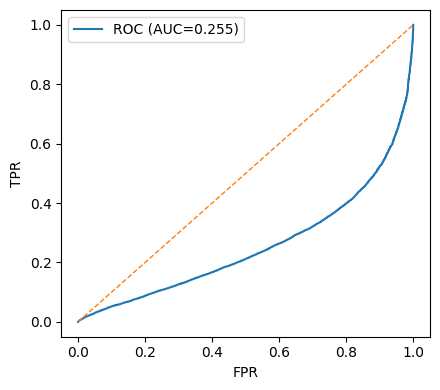

In [21]:
import numpy as np, matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, auc

# build ID vs OOD labels & scores
scores = np.concatenate([id_err, c100_err, svhn_err])
labels = np.concatenate([
    np.zeros_like(id_err, dtype=int),
    np.ones_like(c100_err, dtype=int),
    np.ones_like(svhn_err, dtype=int),
])

auroc = roc_auc_score(labels, scores)
fpr, tpr, thr = roc_curve(labels, scores)
best_idx = np.argmax(tpr - fpr)
best_thr = thr[best_idx]

print(f"AUROC (ID vs OOD): {auroc:.3f}")
print(f"Best Youden threshold: {best_thr:.5f}")

plt.figure(figsize=(4.5,4))
plt.plot(fpr, tpr, label=f"ROC (AUC={auroc:.3f})")
plt.plot([0,1],[0,1],'--',lw=1)
plt.xlabel("FPR"); plt.ylabel("TPR"); plt.legend(); plt.tight_layout(); plt.show()


###GAN Stress Test: Latent Extrapolation (far from N(0,I))

Scales shown (top→bottom rows): [1.0, 2.0, 4.0, 8.0]


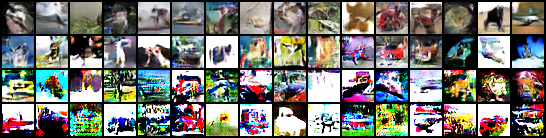

In [22]:

import torch
from torchvision.utils import make_grid, save_image

Gnet.eval()
scales = [1.0, 2.0, 4.0, 8.0]
rows = []
with torch.no_grad():
    for s in scales:
        z = torch.randn(16, nz, device=device) * s
        x = Gnet(z).add(1).div(2).clamp(0,1)
        rows.append(x)
grid = make_grid(torch.cat(rows, dim=0), nrow=16, normalize=True, value_range=(0,1))
save_image(grid, OUT/"figs"/"gan_latent_extrapolation.png")

print("Scales shown (top→bottom rows):", scales)
show_png(OUT/"figs"/"gan_latent_extrapolation.png", width=960)


###OOD Summary Table

In [23]:
import pandas as pd
df = pd.DataFrame([
    {"Set":"ID (CIFAR-10)", "mean_MSE":float(id_err.mean()),   "std_MSE":float(id_err.std()),   "n":len(id_err)},
    {"Set":"OOD (CIFAR-100)", "mean_MSE":float(c100_err.mean()), "std_MSE":float(c100_err.std()), "n":len(c100_err)},
    {"Set":"OOD (SVHN)", "mean_MSE":float(svhn_err.mean()), "std_MSE":float(svhn_err.std()), "n":len(svhn_err)},
])
display(df)


,Set,mean_MSE,std_MSE,n
0,ID (CIFAR-10),0.017408,0.006859,10000
1,OOD (CIFAR-100),0.018014,0.007775,10000
2,OOD (SVHN),0.009465,0.005703,26032
